In [133]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import ipywidgets as ip
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import RidgeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix

In [37]:
df = pd.read_csv('./dataset/weatherAUS.csv')

In [38]:
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [39]:
df.tail()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
145455,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
145456,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
145457,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
145458,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No
145459,2017-06-25,Uluru,14.9,NaN,0.0,NaN,NaN,NaN,NaN,ESE,...,62.0,36.0,1020.2,1017.9,8.0,8.0,15.0,20.9,No,NaN


In [40]:
df.shape

(145460, 23)

This dataset has 145,460 rows and 23 columns.

# Dealing with duplicate values

In [41]:
df.duplicated().sum()

0

There are no duplicates rows in that data set.

# Dealing with null values

In [42]:
df.isna().sum().sort_values(ascending = True)

Date                 0
Location             0
MaxTemp           1261
MinTemp           1485
Temp9am           1767
WindSpeed9am      1767
Humidity9am       2654
WindSpeed3pm      3062
Rainfall          3261
RainToday         3261
RainTomorrow      3267
Temp3pm           3609
WindDir3pm        4228
Humidity3pm       4507
WindGustSpeed    10263
WindGustDir      10326
WindDir9am       10566
Pressure3pm      15028
Pressure9am      15065
Cloud9am         55888
Cloud3pm         59358
Evaporation      62790
Sunshine         69835
dtype: int64

In [43]:
print(df.dropna().shape[0])
print(df.shape[0] - df.dropna().shape[0])
print((df.shape[0] - df.dropna().shape[0]) / df.shape[0] * 100)

56420
89040
61.21270452358036


So, we lose 56,420 rows out of 145,460 rows if we decide to drop null values, i.e. ~60% of the data!
Therefore, Let's we drop the top 4 columns in terms of null values, after that drop null values of remaining columns

In [44]:
df.drop(["Sunshine", "Evaporation", "Cloud3pm", "Cloud9am"], axis = 1, inplace = True)

In [45]:
df.dropna(inplace = True)

In [46]:
df.isnull().sum()

Date             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
dtype: int64

In [47]:
df.shape

(112925, 19)

In [48]:
print("After doing that we lose only ", (145460 - 112925), "columns")
(145460 - 112925) 
print("It is a ", (145460 - 112925) / 145460 * 100," %")

After doing that we lose only  32535 columns
It is a  22.36697373848481  %


In [49]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 112925 entries, 0 to 145458
Data columns (total 19 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           112925 non-null  object 
 1   Location       112925 non-null  object 
 2   MinTemp        112925 non-null  float64
 3   MaxTemp        112925 non-null  float64
 4   Rainfall       112925 non-null  float64
 5   WindGustDir    112925 non-null  object 
 6   WindGustSpeed  112925 non-null  float64
 7   WindDir9am     112925 non-null  object 
 8   WindDir3pm     112925 non-null  object 
 9   WindSpeed9am   112925 non-null  float64
 10  WindSpeed3pm   112925 non-null  float64
 11  Humidity9am    112925 non-null  float64
 12  Humidity3pm    112925 non-null  float64
 13  Pressure9am    112925 non-null  float64
 14  Pressure3pm    112925 non-null  float64
 15  Temp9am        112925 non-null  float64
 16  Temp3pm        112925 non-null  float64
 17  RainToday      112925 non-nul

In [50]:
df.describe()

,MinTemp,MaxTemp,Rainfall,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Temp9am,Temp3pm
count,112925.000000,112925.000000,112925.000000,112925.000000,112925.000000,112925.000000,112925.000000,112925.000000,112925.000000,112925.000000,112925.000000,112925.000000
mean,12.664721,23.655670,2.377892,40.786611,15.179163,19.500545,67.404162,50.669055,1017.425847,1015.048962,17.462008,22.127306
std,6.254135,6.982702,8.602968,13.321774,8.344304,8.580097,18.911610,20.768550,7.032654,6.957822,6.355045,6.837380
min,-8.200000,2.600000,0.000000,7.000000,2.000000,2.000000,0.000000,0.000000,980.500000,977.100000,-3.100000,1.700000
25%,8.100000,18.300000,0.000000,31.000000,9.000000,13.000000,56.000000,36.000000,1012.800000,1010.300000,12.700000,16.900000
50%,12.400000,23.100000,0.000000,39.000000,13.000000,19.000000,68.000000,51.000000,1017.400000,1015.000000,17.100000,21.600000
75%,17.200000,28.700000,0.800000,48.000000,20.000000,24.000000,81.000000,65.000000,1022.100000,1019.700000,22.000000,26.900000
max,33.900000,48.100000,367.600000,135.000000,87.000000,87.000000,100.000000,100.000000,1041.000000,1039.600000,40.200000,46.700000


In [51]:
print("All features :")
print(list(df.columns))
print("\n Numeric features :")
print(list(df._get_numeric_data().columns))
print("\nCategorical features :")
print(list(set(df.columns) - set(df._get_numeric_data().columns)))

All features :
['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Temp9am', 'Temp3pm', 'RainToday', 'RainTomorrow']

 Numeric features :
['MinTemp', 'MaxTemp', 'Rainfall', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Temp9am', 'Temp3pm']

Categorical features :
['Date', 'WindGustDir', 'Location', 'WindDir9am', 'RainTomorrow', 'WindDir3pm', 'RainToday']


<Figure size 1200x1200 with 0 Axes>

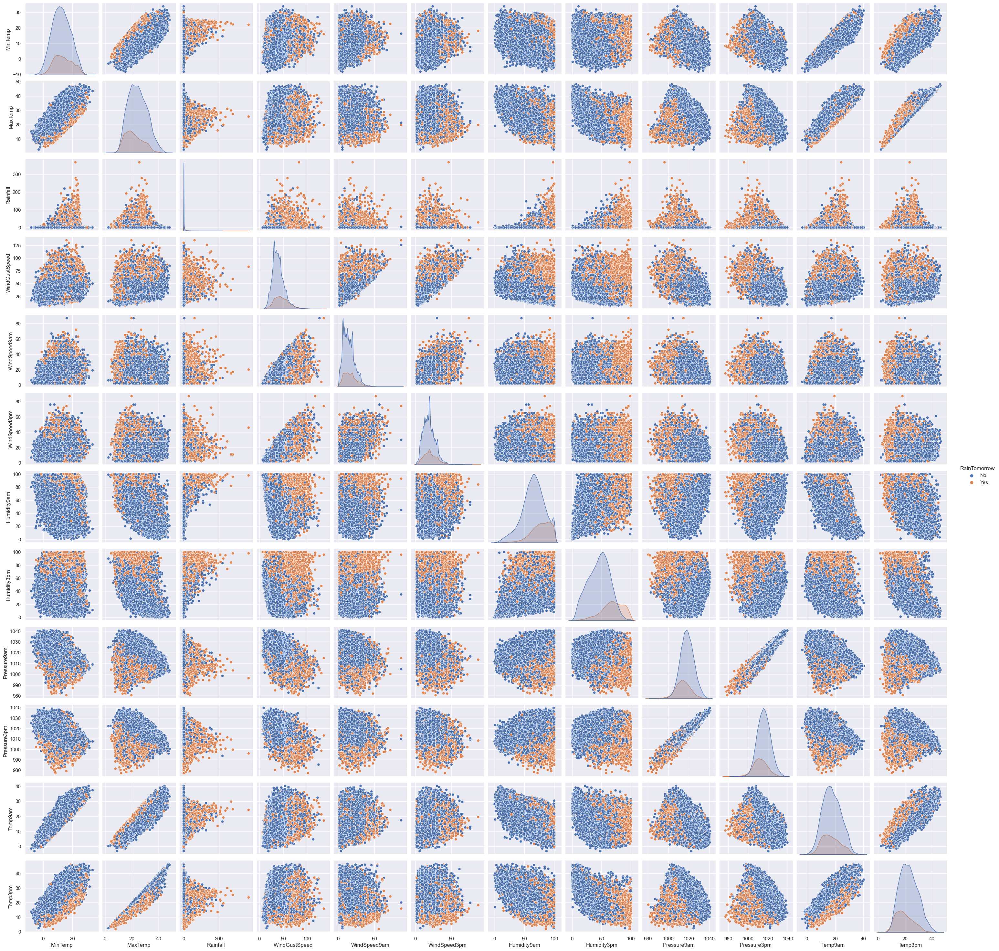

In [17]:
sns.set()
plt.figure(figsize = (12, 12))
sns.pairplot(df, hue = "RainTomorrow")
plt.show()

# Dealing with Numerical Features

In [52]:
c = list(df._get_numeric_data().columns)
c

['MinTemp',
 'MaxTemp',
 'Rainfall',
 'WindGustSpeed',
 'WindSpeed9am',
 'WindSpeed3pm',
 'Humidity9am',
 'Humidity3pm',
 'Pressure9am',
 'Pressure3pm',
 'Temp9am',
 'Temp3pm']

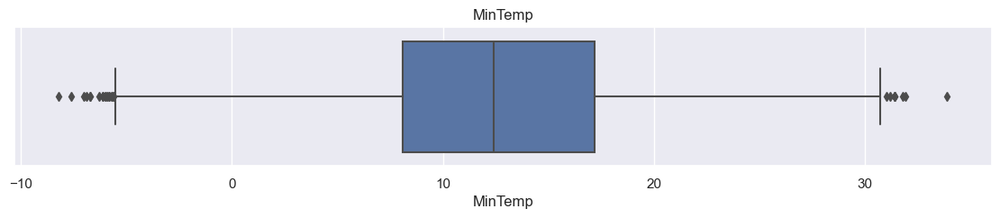

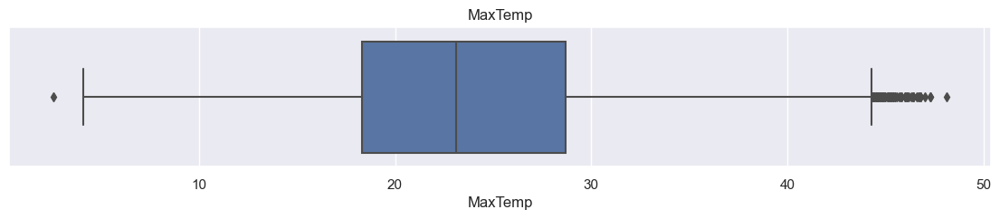

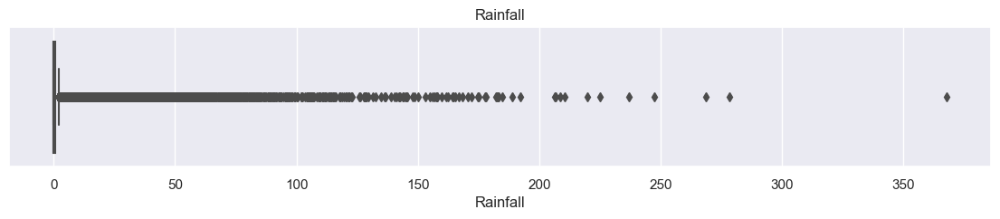

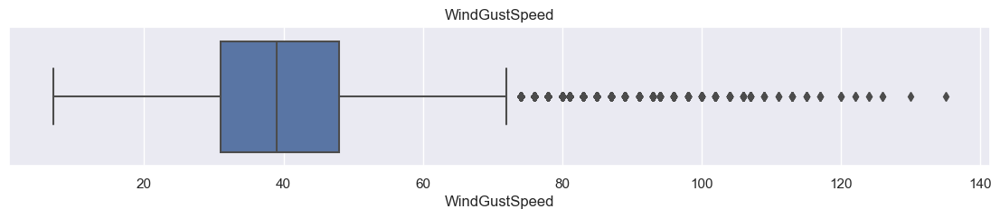

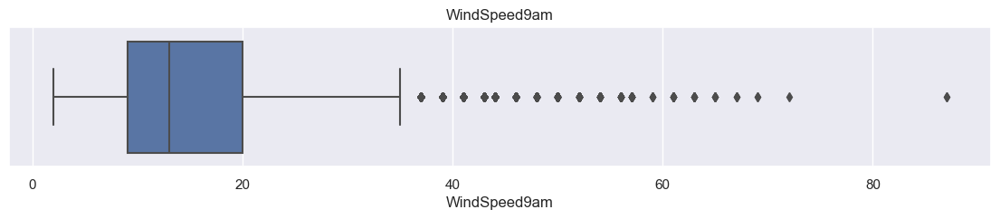

...

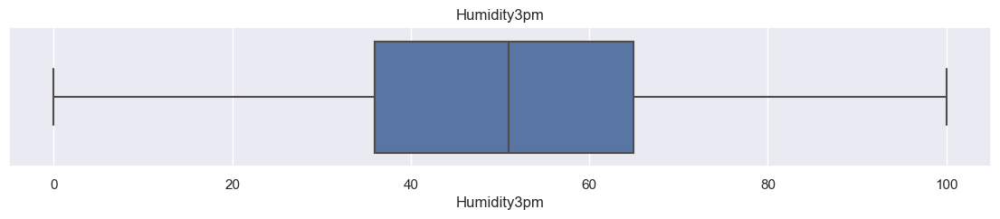

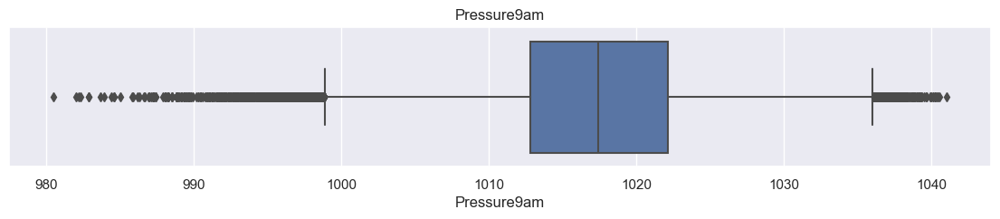

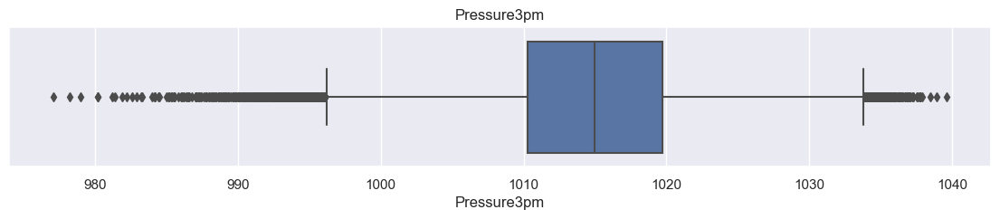

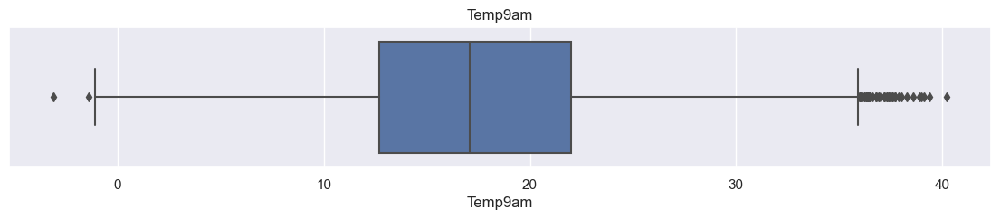

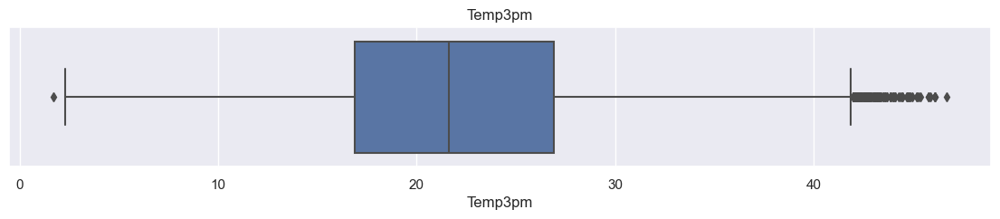

In [53]:
for i in c:
    sns.set()
    plt.figure(figsize = (14, 2))
    sns.boxplot(x = i, data = df)
    plt.title(i)
    plt.show()

In [54]:
for i in c:
    print("\n",i, " :")
    q1 = df[i].quantile(0.25)
    q3 = df[i].quantile(0.75)
    IQR = q3 - q1
    lower = q1 - (IQR * 1.5)
    upper = q3 + (IQR * 1.5)
    print("minimum threshold = ", lower)
    print("miximum threshold = ", upper)
    df.loc[(df[i] <= lower), i] = lower
    df.loc[(df[i] >= upper), i] = upper
    print("--------------------------------------------------------------------------------------------------------------------")


 MinTemp  :
minimum threshold =  -5.549999999999999
miximum threshold =  30.849999999999998
--------------------------------------------------------------------------------------------------------------------

 MaxTemp  :
minimum threshold =  2.700000000000003
miximum threshold =  44.3
--------------------------------------------------------------------------------------------------------------------

 Rainfall  :
minimum threshold =  -1.2000000000000002
miximum threshold =  2.0
--------------------------------------------------------------------------------------------------------------------

 WindGustSpeed  :
minimum threshold =  5.5
miximum threshold =  73.5
--------------------------------------------------------------------------------------------------------------------

 WindSpeed9am  :
minimum threshold =  -7.5
miximum threshold =  36.5
--------------------------------------------------------------------------------------------------------------------

 WindSpeed3pm  :
minimu

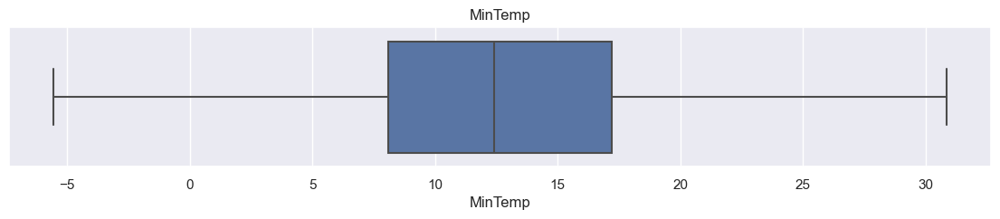

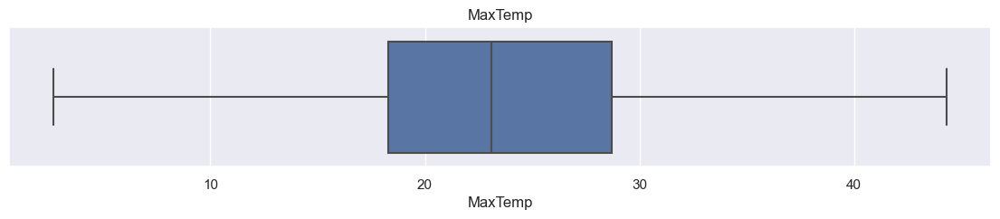

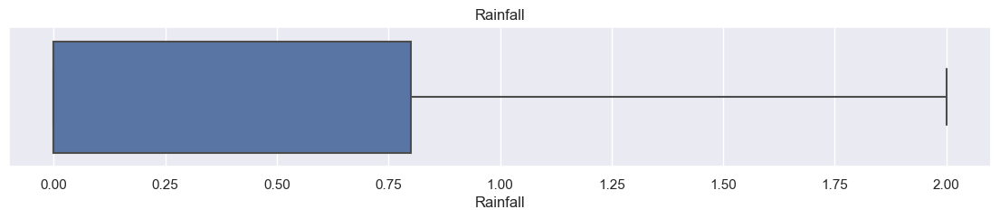

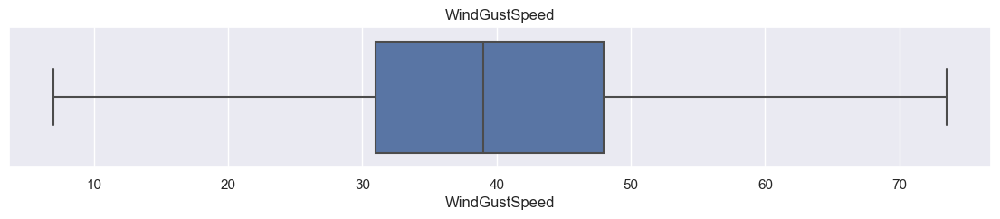

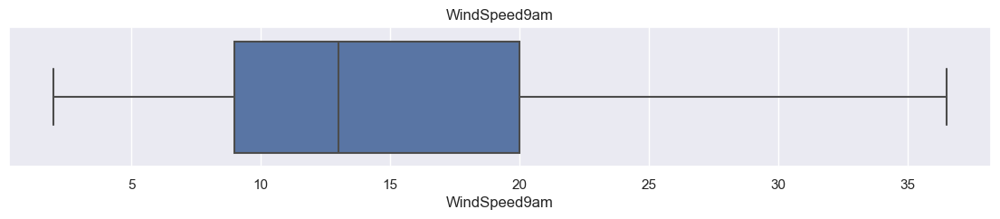

...

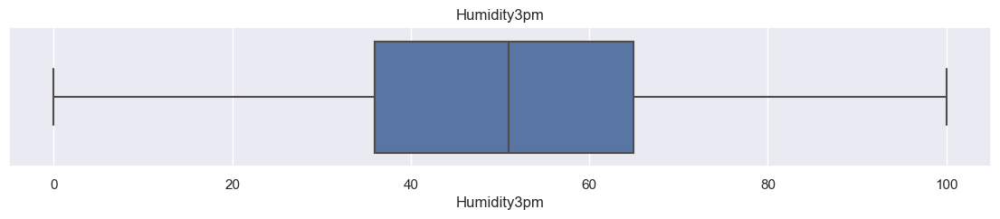

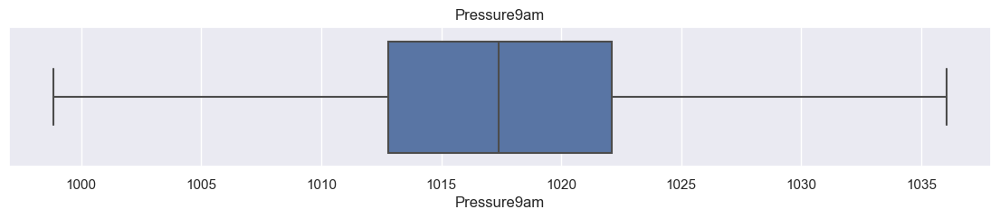

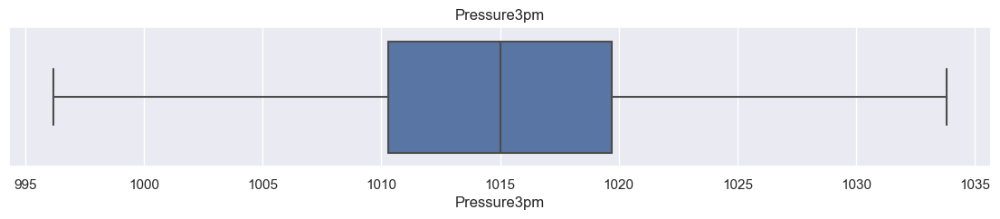

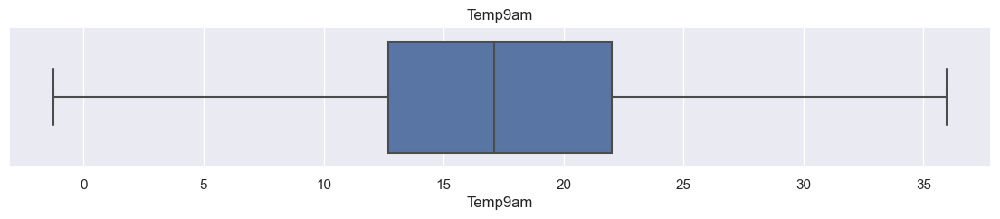

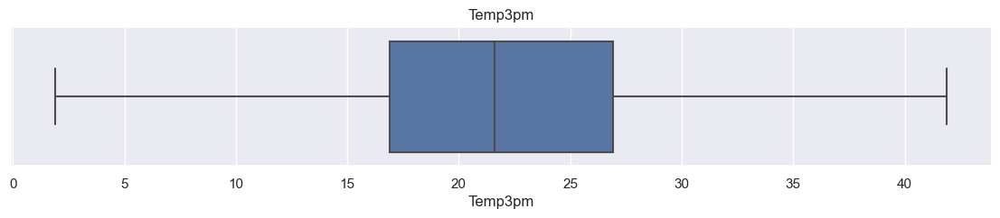

In [55]:
for i in c:
    sns.set()
    plt.figure(figsize = (14, 2))
    sns.boxplot(x = i, data = df)
    plt.title(i)
    plt.show()

In [56]:
df.shape

(112925, 19)

# Dealing with Categorical Features

In [57]:
cat = list(set(df.columns) - set(df._get_numeric_data().columns))
print(cat)

['Date', 'WindGustDir', 'Location', 'WindDir9am', 'RainTomorrow', 'WindDir3pm', 'RainToday']


In [58]:
df.drop(columns = ['Location', 'Date'], axis = 1, inplace = True)

In [59]:
df.head()

,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,13.4,22.9,0.6,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,16.9,21.8,No,No
1,7.4,25.1,0.0,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,17.2,24.3,No,No
2,12.9,25.7,0.0,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,21.0,23.2,No,No
3,9.2,28.0,0.0,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,18.1,26.5,No,No
4,17.5,32.3,1.0,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,17.8,29.7,No,No


In [60]:
df.shape

(112925, 17)

In [61]:
cat = list(set(df.columns) - set(df._get_numeric_data().columns))
cat

['WindGustDir', 'WindDir9am', 'RainTomorrow', 'WindDir3pm', 'RainToday']

WindGustDir  :
W      8380
SE     8087
E      7835
SSE    7728
S      7728
N      7679
WSW    7629
SW     7575
SSW    7379
ENE    6759
WNW    6742
NW     6404
ESE    6223
NE     6053
NNE    5490
NNW    5234
Name: WindGustDir, dtype: int64




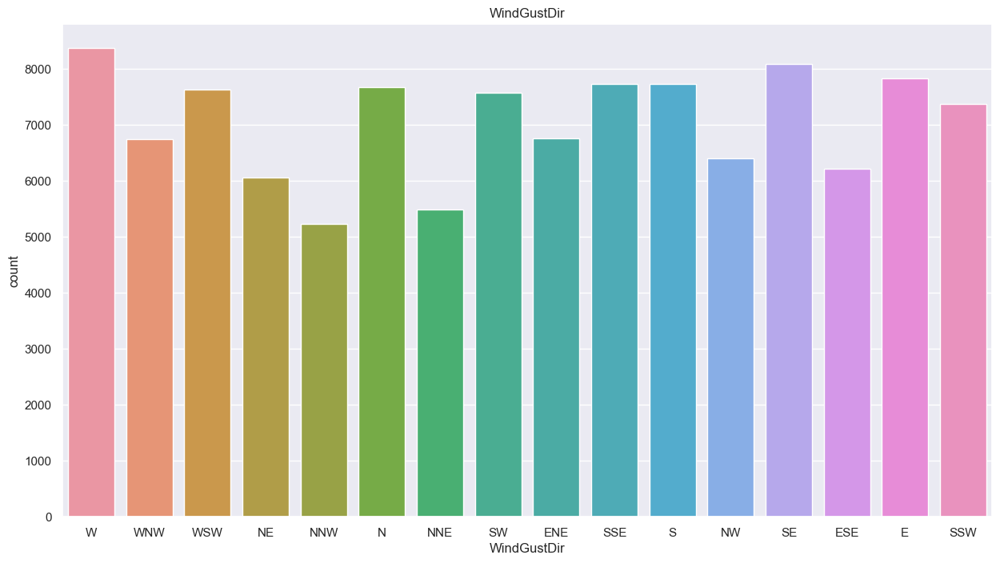


 ---------------------------------------------------------------------------------------------------------------------

WindDir9am  :
N      9815
SSE    8122
E      7980
SE     7824
S      7516
SW     6979
NNE    6949
ENE    6858
ESE    6625
NW     6614
W      6608
NNW    6554
NE     6383
SSW    6261
WNW    5986
WSW    5851
Name: WindDir9am, dtype: int64




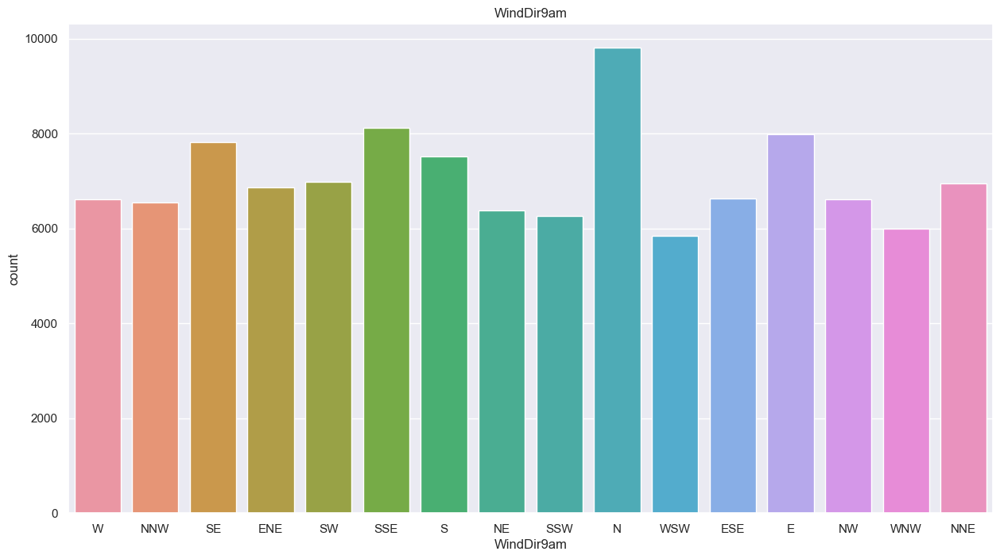


 ---------------------------------------------------------------------------------------------------------------------

RainTomorrow  :
No     87906
Yes    25019
Name: RainTomorrow, dtype: int64




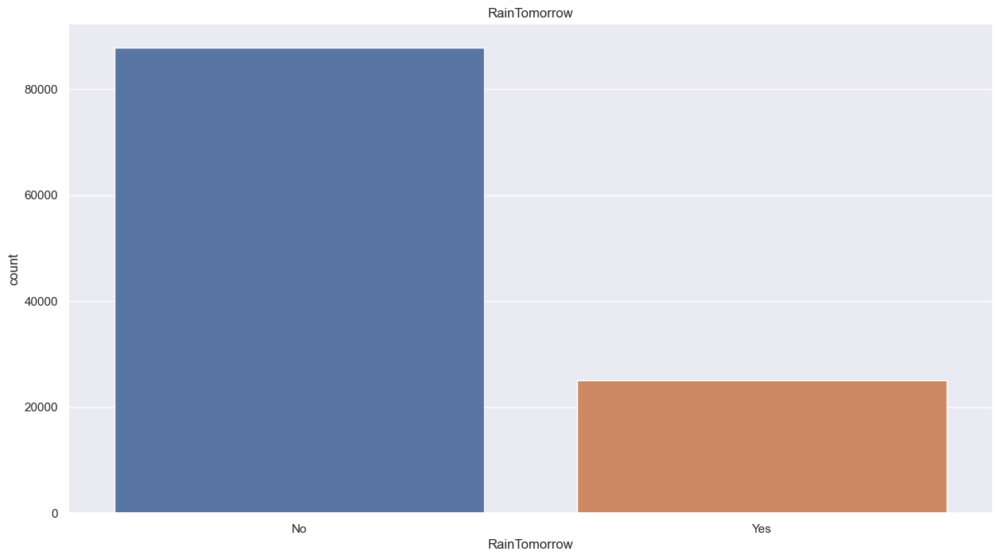


 ---------------------------------------------------------------------------------------------------------------------

WindDir3pm  :
SE     8325
S      8136
W      7948
SSE    7794
WSW    7772
SW     7656
N      7201
WNW    6933
ESE    6867
E      6717
SSW    6688
NE     6622
ENE    6526
NW     6384
NNW    6061
NNE    5295
Name: WindDir3pm, dtype: int64




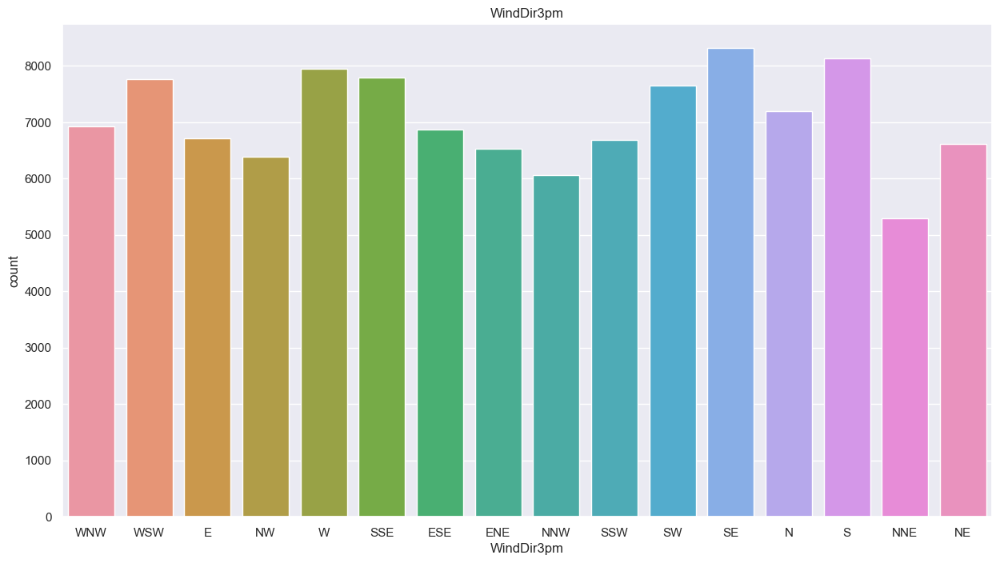


 ---------------------------------------------------------------------------------------------------------------------

RainToday  :
No     87556
Yes    25369
Name: RainToday, dtype: int64




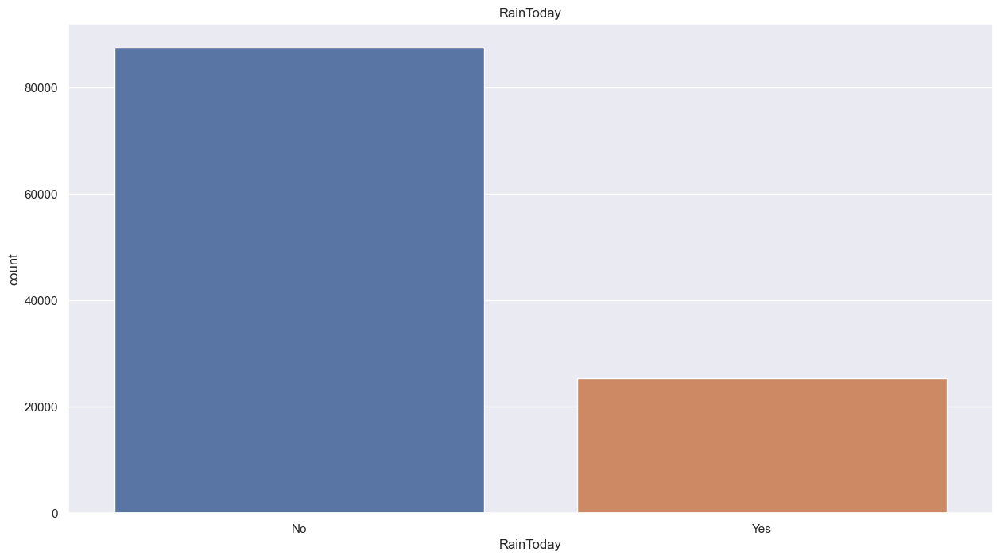


 ---------------------------------------------------------------------------------------------------------------------



In [62]:
for i in cat:
    print(i ," :")
    print(df[i].value_counts().sort_values(ascending = False))
    print("\n")
    sns.set()
    plt.figure(figsize = (15, 8))
    sns.countplot(x = i, data = df)
    plt.title(i)
    plt.show()
    print("\n ---------------------------------------------------------------------------------------------------------------------\n")

In [63]:
df = pd.get_dummies(data = df, columns = ['WindDir9am', 'WindGustDir', 'WindDir3pm'], drop_first = True) 

In [64]:
print(df.shape)
df.head()

(112925, 59)


,MinTemp,MaxTemp,Rainfall,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,...,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW
0,13.4,22.9,0.6,44.0,20.0,24.0,71.0,22.0,1007.7,1007.1,...,0,0,0,0,0,0,0,0,1,0
1,7.4,25.1,0.0,44.0,4.0,22.0,44.0,25.0,1010.6,1007.8,...,0,0,0,0,0,0,0,0,0,1
2,12.9,25.7,0.0,46.0,19.0,26.0,38.0,30.0,1007.6,1008.7,...,0,0,0,0,0,0,0,0,0,1
3,9.2,28.0,0.0,24.0,11.0,9.0,45.0,16.0,1017.6,1012.8,...,0,0,0,0,0,0,0,0,0,0
4,17.5,32.3,1.0,41.0,7.0,20.0,82.0,33.0,1010.8,1006.0,...,0,1,0,0,0,0,0,0,0,0


In [65]:
df["RainToday"] = pd.get_dummies(df["RainToday"], drop_first = True)
df["RainTomorrow"] = pd.get_dummies(df["RainTomorrow"], drop_first = True)

In [66]:
df.shape

(112925, 59)

# Scaling dataset.

In [135]:
sc = StandardScaler()
sc.fit(df)

StandardScaler()

In [136]:
df1 = sc.transform(df)
df = pd.DataFrame(data = df1, columns = df.columns, index = df.index)

df.head()

,MinTemp,MaxTemp,Rainfall,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Temp9am,...,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW
0,0.117569,-0.108151,0.142780,0.269312,0.615391,0.554669,0.188442,-1.380413,-1.404763,-0.088376,...,-0.238153,-0.244787,-0.278643,-0.282115,-0.272279,-0.250906,-0.269681,-0.275158,3.909993,-0.271866
1,-0.841887,0.207016,-0.613448,0.269312,-1.384159,0.313238,-1.253943,-1.235963,-0.986858,-0.041156,...,-0.238153,-0.244787,-0.278643,-0.282115,-0.272279,-0.250906,-0.269681,-0.275158,-0.255755,3.678277
2,0.037614,0.292971,-0.613448,0.427029,0.490419,0.796100,-1.574474,-0.995214,-1.419174,0.556959,...,-0.238153,-0.244787,-0.278643,-0.282115,-0.272279,-0.250906,-0.269681,-0.275158,-0.255755,3.678277
3,-0.554051,0.622464,-0.613448,-1.307866,-0.509356,-1.256066,-1.200522,-1.669313,0.021880,0.100503,...,-0.238153,-0.244787,-0.278643,-0.282115,-0.272279,-0.250906,-0.269681,-0.275158,-0.255755,-0.271866
4,0.773197,1.238473,0.646931,0.032735,-1.009243,0.071806,0.776080,-0.850764,-0.958037,0.053283,...,-0.238153,4.085187,-0.278643,-0.282115,-0.272279,-0.250906,-0.269681,-0.275158,-0.255755,-0.271866


# Correlation

In [34]:
corr = df.corr()

sns.set()
plt.figure(figsize = (150, 150))
sns.heatmap(corr, annot = True)
plt.show()

In [70]:
corr = df.corr().abs()

upper = corr.where(np.triu(np.ones(corr.shape), k=1).astype(np.bool))
upper

C:\Users\pinil\AppData\Local\Temp\ipykernel_380\558802264.py:3: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  upper = corr.where(np.triu(np.ones(corr.shape), k=1).astype(np.bool))


,MinTemp,MaxTemp,Rainfall,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,...,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW
MinTemp,NaN,0.728988,0.040413,0.166416,0.154926,0.150092,0.217706,0.026741,0.440145,0.453199,...,0.065243,0.060120,0.021557,0.066128,0.019311,0.047550,0.054889,0.070716,0.040851,0.064197
MaxTemp,NaN,NaN,0.273487,0.062297,0.003786,0.016781,0.515564,0.497638,0.319826,0.417147,...,0.002831,0.008150,0.073339,0.024361,0.021066,0.072173,0.057902,0.059026,0.020074,0.056935
Rainfall,NaN,NaN,NaN,0.159847,0.102182,0.090893,0.418781,0.423649,0.190401,0.100461,...,0.025494,0.007684,0.035105,0.005553,0.012607,0.050208,0.038612,0.053394,0.036572,0.047463
WindGustSpeed,NaN,NaN,NaN,NaN,0.587658,0.679268,0.188418,0.023293,0.442459,0.396387,...,0.020630,0.062303,0.006291,0.032917,0.005028,0.005796,0.004877,0.080759,0.081404,0.043661
WindSpeed9am,NaN,NaN,NaN,NaN,NaN,0.490954,0.226159,0.020211,0.199614,0.148729,...,0.027401,0.020441,0.042574,0.042154,0.058033,0.004141,0.012275,0.015945,0.001903,0.000342
WindSpeed3pm,NaN,NaN,NaN,NaN,NaN,NaN,0.095573,0.053424,0.282655,0.242161,...,0.015969,0.023282,0.010024,0.007656,0.007303,0.018444,0.001097,0.056984,0.053476,0.026749
Humidity9am,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.684138,0.117067,0.169421,...,0.016788,0.001429,0.039282,0.015897,0.002001,0.035039,0.003309,0.003132,0.005038,0.004134
Humidity3pm,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.033749,0.048097,...,0.036288,0.043733,0.054639,0.018812,0.034635,0.026708,0.014090,0.022763,0.032330,0.024857
Pressure9am,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.960540,...,0.037615,0.088685,0.072136,0.071105,0.069166,0.027065,0.026095,0.109497,0.120958,0.071930
Pressure3pm,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.073109,0.110564,0.111220,0.076059,0.091828,0.070404,0.020867,0.078174,0.118094,0.026648


In [71]:
to_drop = list(column for column in upper.columns if any(upper[column] > 0.95))

to_drop

['Pressure3pm', 'Temp3pm', 'RainToday']

In [72]:
df.drop(columns = to_drop, axis=1, inplace = True)
df.head()

,MinTemp,MaxTemp,Rainfall,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Temp9am,...,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW
0,0.520604,0.485577,0.3,0.556391,0.521739,0.571429,0.644172,0.22,0.237903,0.487903,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,0.355769,0.538462,0.0,0.556391,0.057971,0.519481,0.312883,0.25,0.315860,0.495968,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,0.506868,0.552885,0.0,0.586466,0.492754,0.623377,0.239264,0.30,0.235215,0.598118,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,0.405220,0.608173,0.0,0.255639,0.260870,0.181818,0.325153,0.16,0.504032,0.520161,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.633242,0.711538,0.5,0.511278,0.144928,0.467532,0.779141,0.33,0.321237,0.512097,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


# Splitting the Data

In [73]:
x = df.drop(columns = 'RainTomorrow', axis = 1)
y = df['RainTomorrow']

In [74]:
print(x.shape)
x.head()

(112925, 55)


,MinTemp,MaxTemp,Rainfall,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Temp9am,...,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW
0,0.520604,0.485577,0.3,0.556391,0.521739,0.571429,0.644172,0.22,0.237903,0.487903,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,0.355769,0.538462,0.0,0.556391,0.057971,0.519481,0.312883,0.25,0.315860,0.495968,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,0.506868,0.552885,0.0,0.586466,0.492754,0.623377,0.239264,0.30,0.235215,0.598118,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,0.405220,0.608173,0.0,0.255639,0.260870,0.181818,0.325153,0.16,0.504032,0.520161,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.633242,0.711538,0.5,0.511278,0.144928,0.467532,0.779141,0.33,0.321237,0.512097,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [75]:
print(y.shape)
y.head()

(112925,)


0    0.0
1    0.0
2    0.0
3    0.0
4    0.0
Name: RainTomorrow, dtype: float64

# Model training

## Logistic Regression

In [137]:
param_grid = {'penalty' : ['l1', 'l2', 'elasticnet', None],
              'C': [0.001, 0.01, 1],
                'fit_intercept': [True, False]
             }

In [138]:
lgr = LogisticRegression()

In [139]:
lgr_gsv = GridSearchCV(lgr, param_grid, cv = 10, scoring = 'accuracy')
lgr_gsv.fit(x, y)

C:\Users\pinil\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
180 fits failed out of a total of 240.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
60 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\pinil\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 680, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\pinil\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 1461, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "C:\Users\pinil\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 447, in _check_solver
    raise ValueError(
Va

GridSearchCV(cv=10, estimator=LogisticRegression(),
             param_grid={'C': [0.001, 0.01, 1], 'fit_intercept': [True, False],
                         'penalty': ['l1', 'l2', 'elasticnet', None]},
             scoring='accuracy')

In [140]:
print("Best parameters for Logistic Regression : ", lgr_gsv.best_params_)

Best parameters for Logistic Regression :  {'C': 1, 'fit_intercept': True, 'penalty': 'l2'}


In [141]:
print("Accuracy score using best parameters : ", lgr_gsv.best_score_)

Accuracy score using best parameters :  0.8442863086324687


In [142]:
lgr = LogisticRegression(C = 1, fit_intercept = True, penalty = 'l2')
lgr.fit(x, y)

LogisticRegression(C=1)

In [143]:
y_pre = lgr.predict(x)
print(classification_report(y, y_pre))

              precision    recall  f1-score   support

         0.0       0.87      0.95      0.91     87906
         1.0       0.73      0.50      0.59     25019

    accuracy                           0.85    112925
   macro avg       0.80      0.72      0.75    112925
weighted avg       0.84      0.85      0.84    112925



<AxesSubplot:>

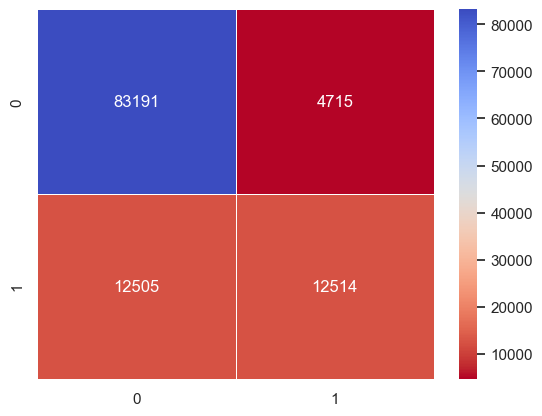

In [144]:
sns.set()
sns.heatmap(confusion_matrix(y, y_pre), annot = True, linewidths = 0.6, cmap = "coolwarm_r", fmt = 'g')

## Ridge Classifier

In [145]:
param_grid = {
    'alpha': [0.1, 1.0],
    'fit_intercept': [True, False],
    'normalize': [True, False],
    'solver': ['auto', 'svd'], 
}

In [146]:
rc = RidgeClassifier()
rc_gsc = GridSearchCV(rc, param_grid, cv = 10, scoring = 'accuracy')
rc_gsc.fit(x, y)

C:\Users\pinil\anaconda3\lib\site-packages\sklearn\linear_model\_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), RidgeClassifier())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * n_samples. 
  warnings.warn(
C:\Users\pinil\anaconda3\lib\site-packages\sklearn\linear_model\_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:



C:\Users\pinil\anaconda3\lib\site-packages\sklearn\linear_model\_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), RidgeClassifier())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * n_samples. 
  warnings.warn(
C:\Users\pinil\anaconda3\lib\site-packages\sklearn\linear_model\_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:



C:\Users\pinil\anaconda3\lib\site-packages\sklearn\linear_model\_base.py:148: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2. Please leave the normalize parameter to its default value to silence this warning. The default behavior of this estimator is to not do any normalization. If normalization is needed please use sklearn.preprocessing.StandardScaler instead.
  warnings.warn(
C:\Users\pinil\anaconda3\lib\site-packages\sklearn\linear_model\_base.py:148: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2. Please leave the normalize parameter to its default value to silence this warning. The default behavior of this estimator is to not do any normalization. If normalization is needed please use sklearn.preprocessing.StandardScaler instead.
  warnings.warn(
C:\Users\pinil\anaconda3\lib\site-packages\sklearn\linear_model\_base.py:148: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2. P

C:\Users\pinil\anaconda3\lib\site-packages\sklearn\linear_model\_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), RidgeClassifier())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * n_samples. 
  warnings.warn(
C:\Users\pinil\anaconda3\lib\site-packages\sklearn\linear_model\_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:



C:\Users\pinil\anaconda3\lib\site-packages\sklearn\linear_model\_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), RidgeClassifier())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * n_samples. 
  warnings.warn(
C:\Users\pinil\anaconda3\lib\site-packages\sklearn\linear_model\_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:



C:\Users\pinil\anaconda3\lib\site-packages\sklearn\linear_model\_base.py:148: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2. Please leave the normalize parameter to its default value to silence this warning. The default behavior of this estimator is to not do any normalization. If normalization is needed please use sklearn.preprocessing.StandardScaler instead.
  warnings.warn(
C:\Users\pinil\anaconda3\lib\site-packages\sklearn\linear_model\_base.py:148: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2. Please leave the normalize parameter to its default value to silence this warning. The default behavior of this estimator is to not do any normalization. If normalization is needed please use sklearn.preprocessing.StandardScaler instead.
  warnings.warn(
C:\Users\pinil\anaconda3\lib\site-packages\sklearn\linear_model\_base.py:148: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2. P

C:\Users\pinil\anaconda3\lib\site-packages\sklearn\linear_model\_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), RidgeClassifier())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * n_samples. 
  warnings.warn(
C:\Users\pinil\anaconda3\lib\site-packages\sklearn\linear_model\_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:



C:\Users\pinil\anaconda3\lib\site-packages\sklearn\linear_model\_base.py:148: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2. Please leave the normalize parameter to its default value to silence this warning. The default behavior of this estimator is to not do any normalization. If normalization is needed please use sklearn.preprocessing.StandardScaler instead.
  warnings.warn(
C:\Users\pinil\anaconda3\lib\site-packages\sklearn\linear_model\_base.py:148: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2. Please leave the normalize parameter to its default value to silence this warning. The default behavior of this estimator is to not do any normalization. If normalization is needed please use sklearn.preprocessing.StandardScaler instead.
  warnings.warn(
C:\Users\pinil\anaconda3\lib\site-packages\sklearn\linear_model\_base.py:148: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2. P

C:\Users\pinil\anaconda3\lib\site-packages\sklearn\linear_model\_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), RidgeClassifier())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * n_samples. 
  warnings.warn(
C:\Users\pinil\anaconda3\lib\site-packages\sklearn\linear_model\_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:



C:\Users\pinil\anaconda3\lib\site-packages\sklearn\linear_model\_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:

from sklearn.pipeline import make_pipeline

model = make_pipeline(StandardScaler(with_mean=False), RidgeClassifier())

If you wish to pass a sample_weight parameter, you need to pass it as a fit parameter to each step of the pipeline as follows:

kwargs = {s[0] + '__sample_weight': sample_weight for s in model.steps}
model.fit(X, y, **kwargs)

Set parameter alpha to: original_alpha * n_samples. 
  warnings.warn(
C:\Users\pinil\anaconda3\lib\site-packages\sklearn\linear_model\_base.py:141: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2.
If you wish to scale the data, use Pipeline with a StandardScaler in a preprocessing stage. To reproduce the previous behavior:



C:\Users\pinil\anaconda3\lib\site-packages\sklearn\linear_model\_base.py:148: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2. Please leave the normalize parameter to its default value to silence this warning. The default behavior of this estimator is to not do any normalization. If normalization is needed please use sklearn.preprocessing.StandardScaler instead.
  warnings.warn(
C:\Users\pinil\anaconda3\lib\site-packages\sklearn\linear_model\_base.py:148: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2. Please leave the normalize parameter to its default value to silence this warning. The default behavior of this estimator is to not do any normalization. If normalization is needed please use sklearn.preprocessing.StandardScaler instead.
  warnings.warn(
C:\Users\pinil\anaconda3\lib\site-packages\sklearn\linear_model\_base.py:148: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2. P

GridSearchCV(cv=10, estimator=RidgeClassifier(),
             param_grid={'alpha': [0.1, 1.0], 'fit_intercept': [True, False],
                         'normalize': [True, False],
                         'solver': ['auto', 'svd']},
             scoring='accuracy')

In [147]:
print("Best parameters for Ridge Classifier : ", rc_gsc.best_params_)

Best parameters for Ridge Classifier :  {'alpha': 1.0, 'fit_intercept': True, 'normalize': False, 'solver': 'auto'}


In [148]:
print("Accuracy score using best parameters : ", rc_gsc.best_score_)

Accuracy score using best parameters :  0.84316161231292


In [151]:
rc = RidgeClassifier(alpha = 1.0, fit_intercept = True, normalize = False, solver = 'auto')
rc.fit(x, y)

C:\Users\pinil\anaconda3\lib\site-packages\sklearn\linear_model\_base.py:148: FutureWarning: 'normalize' was deprecated in version 1.0 and will be removed in 1.2. Please leave the normalize parameter to its default value to silence this warning. The default behavior of this estimator is to not do any normalization. If normalization is needed please use sklearn.preprocessing.StandardScaler instead.
  warnings.warn(


RidgeClassifier(normalize=False)

In [152]:
y_pre = rc.predict(x)
print(classification_report(y, y_pre))

              precision    recall  f1-score   support

         0.0       0.86      0.96      0.91     87906
         1.0       0.75      0.45      0.57     25019

    accuracy                           0.85    112925
   macro avg       0.81      0.71      0.74    112925
weighted avg       0.84      0.85      0.83    112925



<AxesSubplot:>

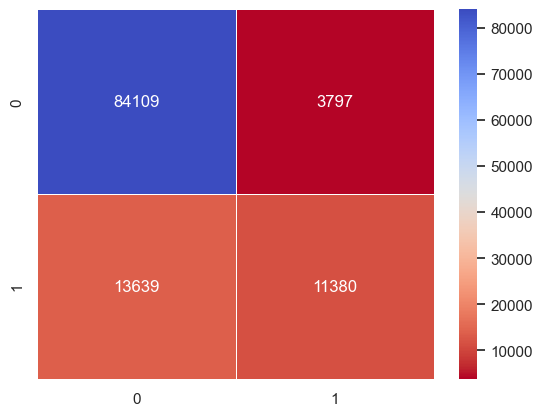

In [153]:
sns.set()
sns.heatmap(confusion_matrix(y, y_pre), annot = True, linewidths = 0.6, cmap = "coolwarm_r", fmt = 'g')

## K-Neighbors Classifier

In [154]:
param_grid = {
    'n_neighbors': [3, 5, 7, 8],
    'weights': ['uniform', 'distance'],
    'p': [1, 2]
}

In [ ]:
knn = KNeighborsClassifier()
knn_gsc = GridSearchCV(knn, param_grid, cv = 10, scoring = 'accuracy') 
knn_gsc.fit(x, y)

C:\Users\pinil\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\Users\pinil\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdim

C:\Users\pinil\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\Users\pinil\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdim